# **1. Introduction** <a class="anchor" id="1"></a>

## **1.2. Import packages**

In [3]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from pandas_profiling import ProfileReport
from sklearn.cluster import AgglomerativeClustering, KMeans
from sklearn.decomposition import PCA

## **1.3. Import data**

In [4]:
data = pd.read_csv('data/donors.csv',index_col=0)

In [5]:
data.shape

(95412, 475)

##First, separate the columns into different section for feature selection

In [6]:
features_Geo = data.columns.values[0:25]   
# The following variables indicate the number of known times the donor has responded to other types of mail order offers.
features_MailRep = data.columns.values[25:39]   
# The following variables indicate micelaneous
features_gr03 = data.columns.values[39:52]   
# The following variables reflect donor interests, as collected from third-party data sources
features_Interest = data.columns.values[52:71]   
# The following variable indicates PEP Star RFA Status
features_PEP = data.columns.values[71]
# The following variables reflect characteristics of the donors neighborhood, as collected from the 2010 US Census.
features_Neighborhood = data.columns.values[72:358]
# The fields listed below are from the promotion history file.
 # Date the ... promotion was mailed
features_ADATE = data.columns.values[358:381]
 #  Donor's RFA status as of .... promotion date
features_RFAStatus = data.columns.values[381:404]
 # The following fields are summary variables from the promotion history file.
features_PromoteSummary = data.columns.values[404:409]

#The following fields are from the giving history file.
 # Date the gift was received for ....
features_RDATE = data.columns.values[409:431]
 # Dollar amount of the gift for ....
features_RAMNT = data.columns.values[431:453] 
 # The following fields are summary variables from the giving history file.
features_ReceiveSummary = data.columns.values[453:466]  

# Control number & Indicator for presence of a published home phone number
features_CNUM = data.columns.values[466:468]

# (See the section on RFA for the meaning of the codes)
features_RFAInfo = data.columns.values[468:474]

# GEOCODE
features_GEOCODE = data.columns.values[474]

# **Manually pick irrelevant features based on type of features**


### 1. Geographic features
- There are various features that are obviously irrelevant or lack of information to properly undestand, so let's first pick them out:-<br>
    1. Remove some geography code and flag related features. These features have very large number of blank values
    2. Remove features have high missing values



In [6]:
data['OSOURCE'].str.contains(' ',na = False).sum()

928

In [7]:
for i in features_Geo:
    if data[i].dtype == object:
        count_nan = data[i].str.contains(' ').sum()
        print (i, str(count_nan))
    else:
        print(i, 0)

ODATEDW 0
OSOURCE 928
TCODE 0
STATE 0
ZIP 0
MAILCODE 94013
PVASTATE 93954
DOB 0
NOEXCH 7
RECINHSE 88709
RECP3 93395
RECPGVG 95298
RECSWEEP 93795
MDMAUD 0
DOMAIN 2316
HOMEOWNR 22228
CHILD03 94266
CHILD07 93846
CHILD12 93601
CHILD18 92565
NUMCHLD 0
INCOME 0
GENDER 2957
WEALTH1 0
HIT 0


<AxesSubplot:>

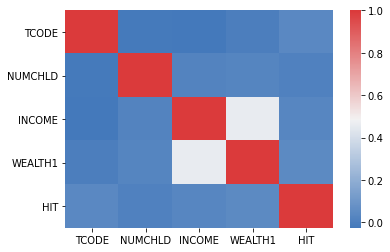

In [8]:
corr = data[features_Geo].corr(method = 'spearman')
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,
        cmap = sns.diverging_palette(250, 12, as_cmap=True))

In [134]:
normal = data[data['MDMAUD'] == 'XXXX']['RAMNTALL'].mean()
major = data[data['MDMAUD'] != 'XXXX']['RAMNTALL'].mean()
print('Average amount major donors', major)
print('Average amount normal donors', normal)

Average amount major donors 929.420612244898
Average amount normal donors 101.93957305662441


In [7]:
df = data.loc[:,'ADATE_2':].copy()

In [8]:
df.head()

,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,...,7.741935,95515,0,L,4,E,X,X,X,C
1,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,2015-10-01,2015-10-01,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaN,2015-10-01,...,7.481481,15078,1,L,4,E,X,X,X,C
3,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2016-02-01,2016-01-01,2015-11-01,NaN,2015-10-01,...,6.812500,172556,1,L,4,E,X,X,X,C
4,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,2015-12-01,2016-01-01,2015-11-01,2015-10-01,2015-09-01,...,6.864865,7112,1,L,2,F,X,X,X,A


In [9]:
df[features_RDATE]

,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,...,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-01,NaN,NaN,...,2015-05-01,2015-05-01,2015-03-01,NaN,NaN,NaN,NaN,NaN,2014-08-01,2014-06-01
1,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-01,NaN,NaN,NaN,...,NaN,2015-04-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-09-01,...,NaN,2015-04-01,NaN,2015-01-01,NaN,NaN,NaN,2014-09-01,2014-07-01,2014-06-01
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2015-12-01,2015-09-01,...,NaN,2015-05-01,2015-03-01,NaN,NaN,2014-11-01,2014-11-01,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,2016-01-01,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,NaN,NaN,NaN,NaN,2016-02-01,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95408,NaN,NaN,NaN,NaN,2016-03-01,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95409,NaN,NaN,NaN,NaN,NaN,2016-01-01,NaN,NaN,NaN,2015-10-01,...,NaN,NaN,NaN,2015-01-01,NaN,NaN,NaN,2014-10-01,NaN,NaN
95410,NaN,2016-08-01,NaN,NaN,NaN,NaN,NaN,2015-12-01,2015-11-01,NaN,...,2015-07-01,2015-06-01,NaN,2015-02-01,NaN,NaN,2015-01-01,2014-10-01,NaN,NaN


In [26]:
# Find the most recent date a donor donated
df[features_RDATE].fillna(method = 'bfill',axis = 1)['RDATE_3']

0        2015-12-01
1        2015-12-01
2        2015-09-01
3        2015-12-01
4        2016-01-01
            ...    
95407    2016-02-01
95408    2016-03-01
95409    2016-01-01
95410    2016-08-01
95411    2015-11-01
Name: RDATE_3, Length: 95412, dtype: object

CARDPROM     -            Lifetime number of card promotions received to date. Card promotions are promotion type FS, GK, TK, SK, NK, XK, UF, UU.  
MAXADATE     -            Date of the most recent promotion received (in YYMM, Year/Month format)  
NUMPROM       -           Lifetime number of promotions received to date  
CARDPM12      -           Number of card promotions received in the last 12 months   
NUMPRM12      -           Number of promotions received in the last 12  months (in terms of calendar months translates into 9603-9702)  
RAMNTALL     -            Dollar amount of lifetime gifts to date  
NGIFTALL     -            Number of lifetime gifts to date  
CARDGIFT     -            Number of lifetime gifts to card promotions to date  
MINRAMNT     -            Dollar amount of smallest gift to date  
MAXRAMNT     -            Dollar amount of largest gift to date  
LASTGIFT      -           Dollar amount of most recent gift  
LASTDATE       -          Date associated with the most recent gift  
FISTDATE        -         Date of first gift  
AVGGIFT            -      Average dollar amount of gifts to date  
RFA_2R          -            Recency code for RFA_2  
RFA_2F          -            Frequency code for RFA_2  
RFA_2A          -            Donation Amount code for RFA_2  
MDMAUD_R        -            Recency code for MDMAUD  
MDMAUD_F        -            Frequecy code for MDMAUD  
MDMAUD_A        -            Donation Amount code for MDMAUD    

In [10]:
feature_to_analyse = np.concatenate((features_PromoteSummary,features_ReceiveSummary,features_RFAInfo))

In [11]:
data_gifts = df[feature_to_analyse]
data_gifts = data_gifts.drop(columns=['MINRDATE','MAXRDATE','NEXTDATE','TIMELAG'])
# convert data to datetime 
data_gifts['MAXADATE'] = pd.to_datetime(data_gifts['MAXADATE'])
data_gifts['LASTDATE'] = pd.to_datetime(data_gifts['LASTDATE'])
data_gifts['FISTDATE'] = pd.to_datetime(data_gifts['FISTDATE'])

237

In [12]:
# measure the time
data_gifts['RECENCY'] = (data_gifts['MAXADATE'] - data_gifts['LASTDATE'])/pd.to_timedelta(1, unit='D')
data_gifts['LIFETIME'] = (data_gifts['MAXADATE'] - data_gifts['FISTDATE'])/pd.to_timedelta(1, unit='D')
data_gifts = data_gifts.drop(columns=['MAXADATE','FISTDATE','LASTDATE','RFA_2R','RFA_2F','RFA_2A','MDMAUD_R','MDMAUD_F','MDMAUD_A'])

<AxesSubplot:>

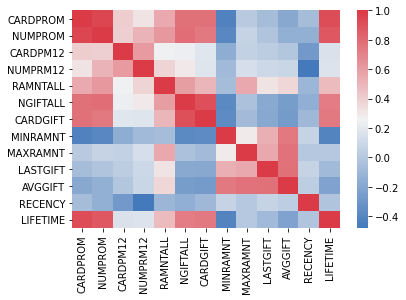

In [14]:
data_gifts
# check for correlation matrix
corr = data_gifts.corr().round(2)
# plot the heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,
        cmap = sns.diverging_palette(250, 10, as_cmap=True))

In [32]:
ProfileReport(data_gifts)

__Warnings from PandasProfiling:__  
Dataset has 10106 (10.6%) duplicate rows  
NUMPROM is highly correlated with CARDPROM    
CARDPROM is highly correlated with NUMPROM and 1 other fields  
CARDGIFT is highly correlated with NGIFTALL  
NGIFTALL is highly correlated with CARDGIFT  
LIFETIME is highly correlated with CARDPROM  
MINRAMNT is highly skewed (γ1 = 23.84991926)  
MAXRAMNT is highly skewed (γ1 = 99.78376176)  
AVGGIFT is highly skewed (γ1 = 26.0494288)  
CARDGIFT has 4968 (5.2%) zeros  

__Action to take:__  
- Remove NUMPROM, keep CARDPROM  
- Remove NGIFTALL, keep CARDGIFT to be relevant with the card promotions  
- Remove LIFETIME  
- Check for outliners of MINRAMNT and MAXRAMNT and AVGGIFT



In [15]:
data_gifts = data_gifts.drop(columns=['NUMPROM','NGIFTALL','LIFETIME'])

In [47]:
# As there is only a few donors donate more than 201 in the minimum, I will consider these donors as outliners
# As there is only a few donors donate more than 1000 in the maximum, I will consider these donors as outliners
data_gifts = data_gifts[data_gifts['MINRAMNT'] <= 201]
data_gifts = data_gifts[data_gifts['MAXRAMNT'] < 1000]
# And delete these outliners also remove the ones on AVGGIFT

In [17]:
data_gifts.columns.values

array(['CARDPROM', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT',
       'MINRAMNT', 'MAXRAMNT', 'LASTGIFT', 'AVGGIFT', 'RECENCY'],
      dtype=object)

### Now we do the normalization using MinMaxScaler

In [48]:
df_scaled = data_gifts.copy()
# scale the df
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df_scaled)
df_scaled.loc[:,:] = scaled_feat

Apply PCA to the normalized data:

In [50]:
pca = PCA()
pca_feat = pca.fit_transform(df_scaled)

In [51]:
# Check for variance
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,0.032258,0.000000,0.466983,0.466983
2,0.024711,-0.007547,0.357730,0.824713
3,0.005316,-0.019395,0.076956,0.901669
4,0.002405,-0.002911,0.034817,0.936486
5,0.002268,-0.000137,0.032839,0.969325
6,0.001252,-0.001016,0.018130,0.987454
7,0.000592,-0.000661,0.008566,0.996021
8,0.000149,-0.000442,0.002161,0.998182
9,0.000085,-0.000064,0.001228,0.999410
10,0.000041,-0.000044,0.000590,1.000000


In [53]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=2)
pca_feat = pca.fit_transform(df_scaled)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_scaled.index, columns=pca_feat_names)  # remember index=df_pca.index
#Concat to the original value
df_scaled = pd.concat([df_scaled, pca_df], axis=1)
df_scaled.head()

,CARDPROM,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,RECENCY,PC0,PC1
0,0.433333,0.315789,0.168831,0.040093,0.341463,0.025,0.011765,0.02,0.019250,0.640052,0.227355,-0.097282
1,0.183333,0.315789,0.155844,0.006005,0.024390,0.050,0.033613,0.05,0.042879,0.640052,-0.114536,0.081759
2,0.416667,0.315789,0.168831,0.033381,0.341463,0.010,0.018487,0.01,0.018474,0.640052,0.216959,-0.091353
3,0.433333,0.315789,0.168831,0.016955,0.170732,0.010,0.010084,0.02,0.016479,0.640052,0.142145,-0.053167
4,0.700000,0.526316,0.311688,0.042565,0.195122,0.015,0.016807,0.03,0.016635,0.599476,0.420818,-0.098580


In [54]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_scaled.corr().loc[data_gifts.columns, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1
CARDPROM,0.879132,-0.422283
CARDPM12,0.494482,0.120741
NUMPRM12,0.515964,0.333419
RAMNTALL,0.577918,-0.178173
CARDGIFT,0.813137,-0.369330
MINRAMNT,-0.476143,0.176504
MAXRAMNT,-0.008465,0.021374
LASTGIFT,-0.132913,0.001951
AVGGIFT,-0.261208,0.112555
RECENCY,-0.487293,-0.868874


__Try to use Kmeans cluster with PCA__

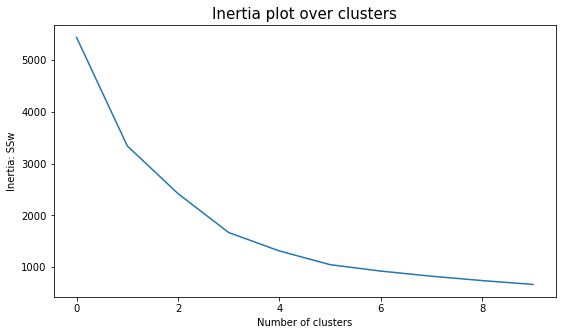

In [90]:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_scaled[pca_feat_names])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [91]:
kmclust = KMeans(n_clusters=3, init='random', n_init=10, random_state=1)
kmclust.fit(df_scaled[pca_feat_names])
# the predict method
KM_labels = kmclust.predict(df_scaled[pca_feat_names])

In [92]:
df_concat = pd.concat((data_gifts, pd.Series(KM_labels, name='labels')), axis=1)
plot_data = df_concat.groupby('labels').mean()
df_concat.groupby('labels').mean()

,CARDPROM,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,RECENCY
labels,,,,,,,,,,
0.0,17.440277,5.322635,12.763685,96.449222,4.633431,8.245404,19.767835,17.358106,13.492440,433.189825
1.0,18.432946,5.292521,12.559272,103.371172,4.931582,7.976452,20.056515,17.628216,13.459837,464.073219
2.0,19.725142,5.416644,13.150682,114.611006,5.685278,7.388106,19.797336,16.913623,12.901730,430.265719


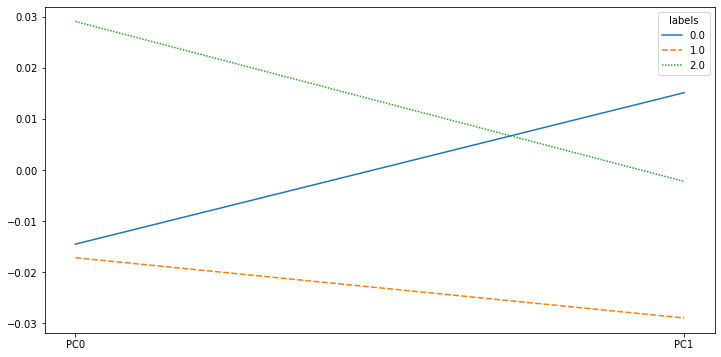

In [93]:
df_concat_PCA = pd.concat((df_scaled[pca_feat_names], pd.Series(KM_labels, name='labels')), axis=1)
plot_data = df_concat_PCA.groupby('labels').mean()
# Plot PCA data
fig, ax = plt.subplots(figsize = (12,6))
ax = sns.lineplot(data = plot_data.T)
plt.show()

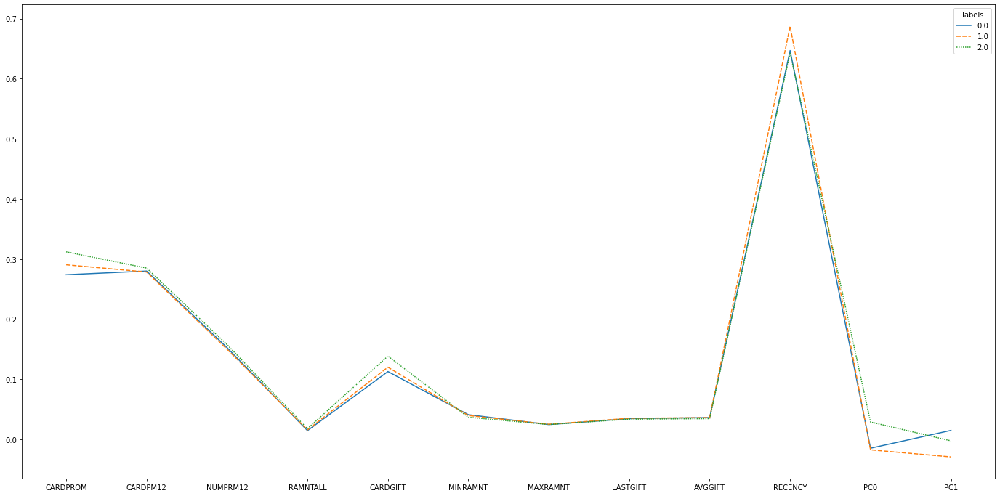

In [95]:
df_concat = pd.concat((df_scaled, pd.Series(KM_labels, name='labels')), axis=1)
plot_data = df_concat.groupby('labels').mean()
# Plot PCA data
fig, ax = plt.subplots(figsize = (24,12))
ax = sns.lineplot(data = plot_data.T)
plt.show()

#### There is not much information to extract from these features => Need more features

In [ ]:
### Try 